# core

> Fill in a module description here

In [1]:
#| default_exp core

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#| hide
from nbdev.showdoc import *
import numpy as np

In [28]:
from fastcore.basics import *
from pathlib import Path
import os
import roboflow
from roboflow import Roboflow
import base64
import random
from sklearn.manifold import TSNE
import time

import plotly.graph_objects as go
import plotly.express as px
import numpy as np

from typing import Dict
from pathlib import Path
#import umap
import umap.umap_ as umap
from IPython.core.display import display, HTML
import supervision as sv
#from IPython.display import display, HTML


/tmp/ipykernel_20606/3143206471.py:19: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



In [39]:
from transformers import CLIPProcessor, CLIPModel
import torch

In [64]:
512//32

16

In [68]:
def normalize(vec: np.ndarray):
    return vec / np.linalg.norm(vec, axis=1, keepdims=True)

In [70]:
normalized_embeddings = normalize(image_features.numpy())
cosine_sim_matrix = np.dot(normalized_embeddings, normalized_embeddings.T)

In [71]:
fig = go.Figure(data=go.Heatmap(z=cosine_sim_matrix, colorscale='Viridis'))

fig.update_layout(
    title="Cosine Similarity Matrix",
    xaxis_title="Image Index",
    yaxis_title="Image Index",
    font=dict(size=14),
    width=1000,
    height=1000,
    margin=dict(t=100, r=100, b=100, l=100),
)

fig.show()

In [56]:
len(image_features)

1

In [58]:
image_features[0].shape

torch.Size([512])

In [50]:
d_z = Path(roboflow_data_path, 'train').ls()[0]
tst_ims =d_z.ls()[0]

In [ ]:
# Initialize CLIP processor and model
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
# Read and preprocess the image
img_ = read_img(tst_ims,cv=False)
image = clip_processor(images=img_, return_tensors="pt")

# Forward pass through the model
with torch.no_grad():
    # Get the image features
    image_features = clip_model.get_image_features(pixel_values=image.pixel_values)


In [ ]:

# Forward pass through the model
with torch.no_grad():
    # Get the image features
    image_features = clip_model.get_image_features(pixel_values=image.pixel_values)


In [4]:
from cv_tools.core import *

In [5]:
api_token=os.getenv('ROBOFLOW_API_KEY')

Codes are  taken from [here](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/image_embeddings_analysis_part_1.ipynb#scrollTo=Ukrw3voSFaxI)

In [11]:
roboflow.login()
rf = Roboflow()

You are already logged into Roboflow. To make a different login,run roboflow.login(force=True).


In [12]:
HOME = Path.home()

In [13]:
project = rf.workspace("roboflow-jvuqo").project("mnist-42000-images-u0qdg")

loading Roboflow workspace...


loading Roboflow project...


In [14]:
roboflow_data_path = Path(HOME, 'projects/data/roboflow')
roboflow_data_path.ls()

(#3) [Path('/home/user/projects/data/roboflow/train'),Path('/home/user/projects/data/roboflow/README.dataset.txt'),Path('/home/user/projects/data/roboflow/README.roboflow.txt')]

In [16]:
dataset = project.version(1).download(
    model_format='folder',
    location=f'{roboflow_data_path}',
    overwrite=False)

In [17]:
def image_to_data_uri(
        image_path:str):
    'returned data URI can be used in HTML and CSS to embed the image directly'
    with open(image_path, "rb") as image_file:
        encoded_image = base64.b64encode(image_file.read()).decode("utf-8")
    return "data:image/jpeg;base64," + encoded_image

In [18]:
SOURCE_DIR=Path(dataset.location, 'train')
class_ids = sorted(get_name_(SOURCE_DIR.ls()))
PER_CLASS_IMAGE_COUNT = 500
class_ids

img_data = []
img_paths = []
images = []
labels = []
img_data_uris = {}
for i in SOURCE_DIR.ls():
    image_fns = i.ls()
    for j in image_fns[:PER_CLASS_IMAGE_COUNT]:
        img = read_img(j)
        images.append(img)
        labels.append(i)
        img_data.append(img.flatten())
        img_paths.append(f'{j}')
        img_data_uris[j]=image_to_data_uri(j)

In [19]:
labels = np.array(labels)
img_data = np.array(img_data)

In [20]:
image_sample = random.sample(images, 9)

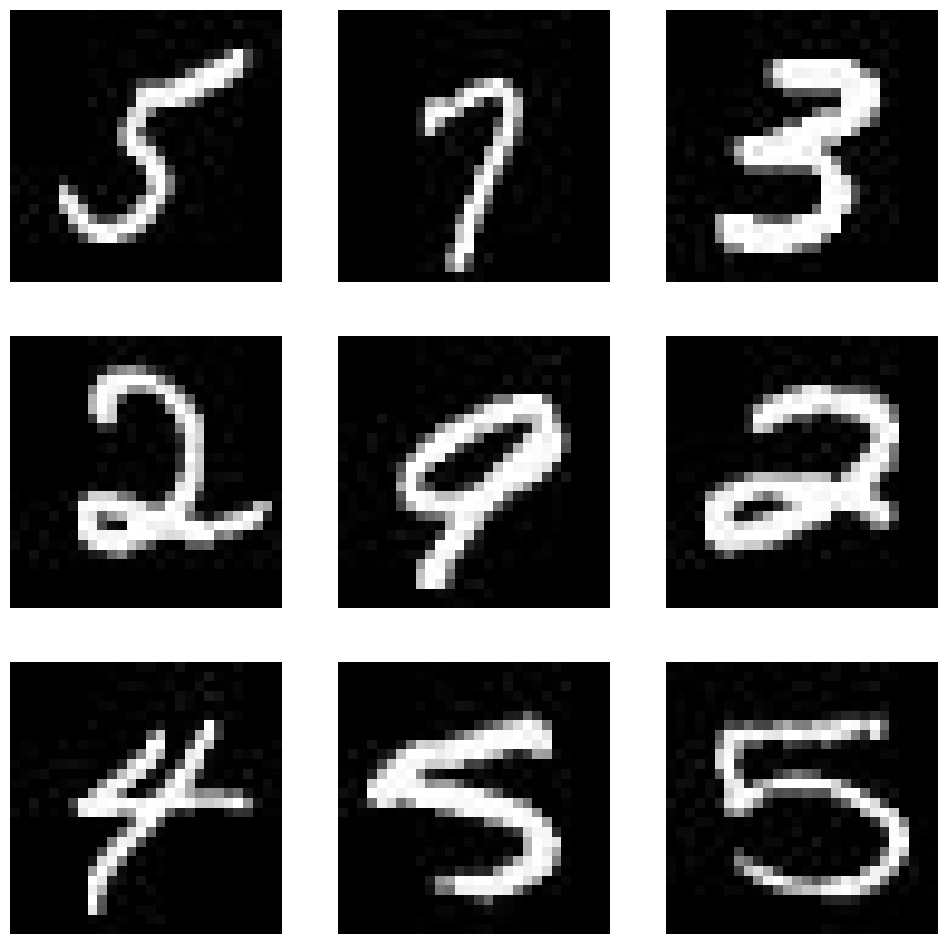

In [21]:
sv.plot_images_grid(
    image_sample, 
    grid_size=(3,3)
)

In [22]:
def get_tsne_projection(
        data:np.ndarray,
        n_projections:int
   ):
    'Get TSNE projections '
    start = time.time()
    tsne = TSNE(
        n_components = n_projections, 
        random_state=0)
    projections = tsne.fit_transform(data)
    end = time.time()
    print(f"generating projections with T-SNE took: {(end-start):.2f} sec")
    return projections

In [23]:
projections = get_tsne_projection(
    data=img_data,
    n_projections=3
)

generating projections with T-SNE took: 49.65 sec


In [24]:
def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    image_paths: np.ndarray,
    image_data_uris: Dict[str, str],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    # Create a separate trace for each unique label
    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_paths[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>path: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    # Create the 3D scatter plot
    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    # Convert the chart to an HTML div string and add an ID to the div
    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    # Define your JavaScript code for copying text on point click
    javascript_code = f"""
    <script>
        function displayImage(imagePath) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imagePath];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        // Get the Plotly chart element by its ID
        var chartElement = document.getElementById('scatter-plot-3d');

        // Add a click event listener to the chart element
        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    # Create an HTML template including the chart div and JavaScript code
    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    # Display the HTML template in the Jupyter Notebook
    display(HTML(html_template))

In [25]:
display_projections(
    labels=get_name_(labels).astype(int),
    projections=projections,
    image_paths=np.array(img_paths),
    image_data_uris=img_data_uris
)

In [31]:
def get_umap_projections(
        data:np.ndarray,
        n_projections:int
    ):
    ' get UMAP projections'
    start = time.time()
    projections = umap.UMAP(
        n_components=n_projections
        ).fit_transform(data)
    end = time.time()
    print(f"generating projections with UMAP took: {(end-start):.2f} sec")
    return projections
    

In [32]:
umap_prj = get_umap_projections(
    data=img_data,
    n_projections=3
)

generating projections with UMAP took: 25.75 sec


In [38]:
display_projections(
    labels=np.array(get_name_(labels)).astype(int),
    projections=umap_prj,
    image_paths=np.array(img_paths),
    image_data_uris=img_data_uris
)

In [112]:
len(np.array(img_paths)[lbls])

5000

In [113]:
len(img_paths)

5000

In [108]:
lbls = get_name_(labels).astype(int)
lbls

array([0, 0, 0, ..., 6, 6, 6])

In [86]:
#| export
def foo(): pass

In [28]:
HOME=Path.home()
roboflow_data_path=Path(HOME,'projects/data/roboflow')
roboflow_data_path.mkdir(parents=True, exist_ok=True)

In [ ]:
data_path=roboflow_data_path

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()